In [1]:
from stanley import stanley_detrending, SFP, stanley_analysis
from stanley import Stanley_Functions as AC
import csv, os
import numpy as np
import pandas as pd
from IPython.display import Image, display
from scipy.ndimage import gaussian_filter1d
import uuid
from multiprocessing import Pool
from argparse import Namespace
import matplotlib.pyplot as plt
from pathlib import Path

#set our base directory
AC._BASE_DIR = Path().resolve()    # folder of the notebook

c:\Users\tklea\anaconda3\envs\stanleynew\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
c:\Users\tklea\anaconda3\envs\stanleynew\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Inputs & run label
SystemName = "TIC260128333"  # KIC or TIC + # (if no mission is provided, STANLEY assumes KIC)
mission = "TIC"
ID = "260128333"
DetrendingName = "TutorialTOI1338ParallelInjection" # short label for figures/files
UseSavedData = 0 # 1=use cached intermediates if available, 0=fresh

# Feature switches
detrending_quadratic = True 
detrending_iterativeCosine = True
detrending_plugHoles = False
detrending_variableDuration = False
detrending_removeKinks = True
detrending_removeCommonFalsePositives = True
detrending_findPotentialLedges = True
detrending_findDeepestPoints = True
detrending_plotSpecificTimes = False
detrending_saveProcessedLightCurve = True
detrending_variableDurationXiTest = False
detrending_testCosine = False
detrending_injectTransits = True

# Binary-physics trend removal
detrending_ellipsoidal = True
detrending_reflection  = True

# Plot behavior
_plot_trends = True
_show_plots = True

In [3]:
# Build the path in the user workspace
save_path = AC.p_user_data("planet_params_TOI1338.csv")
AC._ensure_parent(save_path)

titles = ["", "KIC", "ep", "omegap", "thetap", "Pp_days", "Rp_rEarth"]
params = [0, 10979716, 0, 0.1291298734467532, 5.092903222498788, 115.97737527999979, 6.0]

with open(save_path, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(titles)
    writer.writerow(params)

print(f"Saved CSV to {save_path}")

Saved CSV to C:\Users\tklea\TESSCBP\PUBLIC_RELEASE_STANLEY\Tutorials\UserGeneratedData\planet_params_TOI1338.csv


In [ ]:
injection_csv = AC.p_user_data("planet_params_TOI1338.csv")

# Build kwargs from feature switches defined in the previous cell
kwargs = dict(
    SystemName=SystemName,
    DetrendingName=DetrendingName,
    UseSavedData=UseSavedData,

    detrending_quadratic=detrending_quadratic,
    detrending_iterativeCosine=detrending_iterativeCosine,
    detrending_plugHoles=detrending_plugHoles,
    detrending_variableDuration=detrending_variableDuration,
    detrending_removeKinks=detrending_removeKinks,
    detrending_removeCommonFalsePositives=detrending_removeCommonFalsePositives,
    detrending_findPotentialLedges=detrending_findPotentialLedges,
    detrending_findDeepestPoints=detrending_findDeepestPoints,
    detrending_plotSpecificTimes=detrending_plotSpecificTimes,
    detrending_saveProcessedLightCurve=detrending_saveProcessedLightCurve,
    detrending_variableDurationXiTest=detrending_variableDurationXiTest,
    detrending_testCosine=detrending_testCosine,
    detrending_injectTransits=detrending_injectTransits,

    detrending_ellipsoidal=detrending_ellipsoidal,
    detrending_reflection=detrending_reflection,

    _plot_trends=_plot_trends,
    _show_plots=_show_plots
)

# Only attach the CSV arg if injections are enabled *and* you provided a filename
if detrending_injectTransits and injection_csv:
    kwargs["injection_param_file"] = injection_csv

# Fire the pipeline
res = stanley_detrending.runDetrendingModule(**kwargs)

print("Detrending finished.\nSummary:")
for k, v in res.items():
    print(f"  {k}: {v}")

----- RUNNING DETRENDING CODE -----
System Name = TIC260128333
TIC = 260128333
Detrending Name = TutorialTOI1338ParallelInjection
------
----- DETRENDING SETTINGS -----
Quadratic = True
Iterative Cosine = True
Variable Biweight = False
Plug Holes = False
Remove Common False Positives = True
Remove Kinks = True
Remove Common False Positives = True
Find Potential Ledges = True
Find Deepest Points = True
Plot Specific Times = False
Save Processed Light Curve = True
Variable Duration Xi Test = False
Test Cosine = False
Inject Transits = True
Ellipsoidal Detrending = True
Reflection Detrending = True
------
----- LOADING SYSTEM -----


Total number of sectors downloaded: 39
[saved raw] C:\Users\tklea\TESSCBP\PUBLIC_RELEASE_STANLEY\Tutorials\LightCurves\Raw\260128333_raw.csv
Applying cuts for target 260128333: [[1624.0, 1627.0], [1420.0, 1423.0]]
Searching for orbit data in ANTIC and Villanova catalogs
Orbit and stellar data found in ANTIC
Further orbit/stellar info needed, searching Villanova
[seed] Using provided Pbin as a prior. Local BLS search in [7.304291, 21.912874] d (Δ=7.304291 d).
p_s: 1262186.0929938916
[dips] try factor=1.00 distance=6777 → N_dips=1 (pass=PRIMARY)
[dips] accepted factor=1.00 width_est=0.014451 min_spacing_phase=0.014451 distance=6777 N_dips=1
First pass found exactly one dip — enabling spurious-point removal and re-running primary pass.
[dips] try factor=1.00 distance=6777 → N_dips=1 (pass=PRIMARY)
[dips] accepted factor=1.00 width_est=0.014451 min_spacing_phase=0.014451 distance=6777 N_dips=1
p_s: 252444.95807786327
Initial primary guesses - depth: 0.005001383348003374, loc: 0.5, width: 0

In [ ]:
TotalSectors = 4
OnCluster = 0
SearchName = 'TutorialSearch_TOI1338ParallelInjection'
SystemName = SystemName
DetrendingName = DetrendingName
N_interp = 2
BoundsType = 'days to days'
MinValue = 90
MaxValue = 125
e_max_planet = 0.0

args = Namespace(
    searchName=SearchName,
    systemName=SystemName,
    detrendingName=DetrendingName,
    totalSectors=TotalSectors,
    currentSector=1,
    onCluster=OnCluster,
    parallel=1,
    interpolationValue=N_interp,
    boundsType=BoundsType,
    minValue=MinValue,
    maxValue=MaxValue,
    e_max_planet=e_max_planet,
)

SFP.parallel(args)
print("Search finished for all sectors (parallel).")


In [ ]:
currentSector = 1
SearchName = 'TutorialSearch_TOI1338ParallelInjection'
TotalSectors = 4
OnCluster = 0

# Run analysis module to collate results from all sectors
result = stanley_analysis.runAnalysisModule(
    searchName=SearchName,
    systemName=SystemName,
    totalSectors=TotalSectors,
    currentSector=currentSector,
    onCluster=OnCluster,
)

print("Analysis finished.")
print("Summary:")
for k, v in result.items():
    print(f"  {k}: {v}")


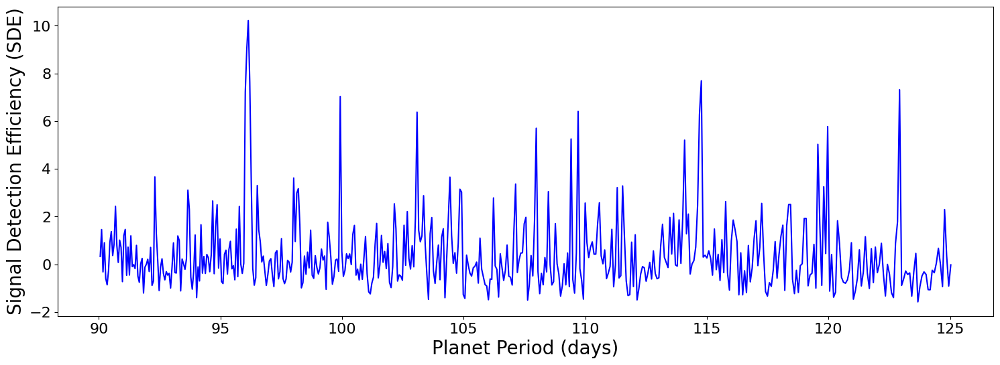

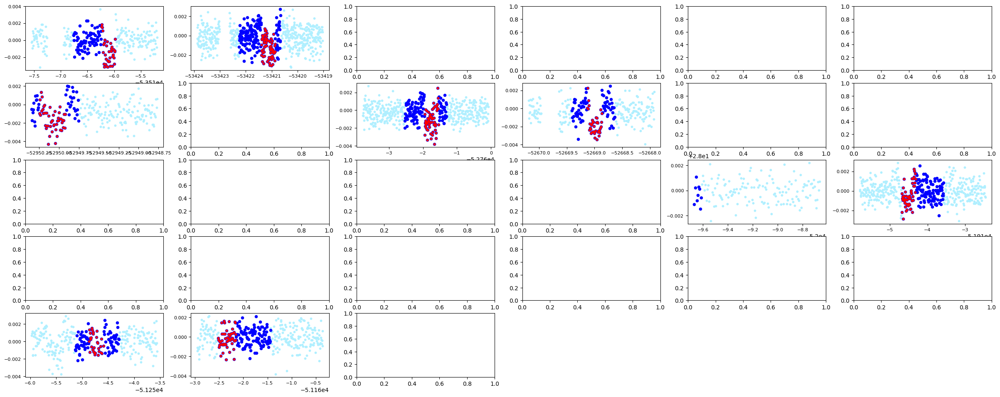

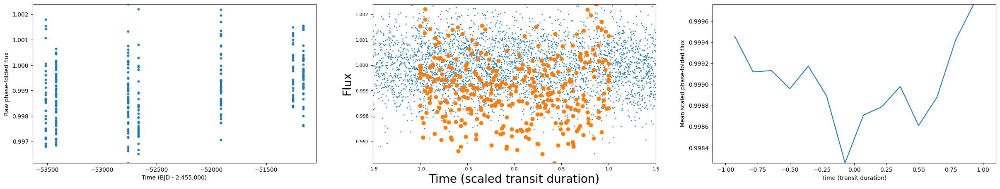

In [ ]:
# Display key search and analysis figures 
fig_dir = os.path.join("PlanetSearchOutput", SearchName)

# Note that an SDE value of above 8 is considered a detection
analysis_figs = [
    f"{ID}_{mission}SDEpaper.png",
    f"{mission}_{ID}_IndividualPlanetTransitsWiderWindow.png",
    f"{mission}_{ID}_FoldedPlanetTransits.png",
]

print("\nSearch and analysis diagnostic plots:\n")

for fname in analysis_figs:
    path = os.path.join(fig_dir, fname)
    if os.path.exists(path):
        print(f"Showing: {fname}")
        display(Image(filename=path, width=950, height=400)) 
    else:
        print(f"Missing: {fname}")


results_file = os.path.join(fig_dir, f"{mission}_{ID}_SearchResults.txt")

print("\n\n==============================")
print("         Search Summary")
print("==============================\n")

if not os.path.exists(results_file):
    print(f"SearchResults file missing: {results_file}")
else:
    summary = {}
    with open(results_file, "r") as f:
        for line in f:
            if "=" in line:
                k, v = line.strip().split("=", 1)
                summary[k.strip()] = v.strip()

    keys_to_show = [
        "System name",
        "mission + ID",
        "Search name",
        "Detrending name",
        "Total sectors",
        "Num Theta_p steps",
        "Search parameter count",
        "SDE_1d (max value)",
        "SDE_1d (period)",
        "Pp (days)",
        "ep",
        "omegap (deg)",
        "thetap (deg)",
        "Transit timing (best fit)"
    ]

    for k in keys_to_show:
        print(f"{k:30s}: {summary.get(k, '---')}")

print("\nDone.")
